# Objective: fine-tuning detectron2/DETR

-   This notebook can be found on my Github profile: https://github.com/woctezuma/finetune-detr
-   Official DETR repository: https://github.com/facebookresearch/detr
-   Discussion about fine-tuning in [a Github issue](https://github.com/facebookresearch/detr/issues/9).
-   A nice blog post about another approach (Mask R-CNN) and the balloon dataset (which we use in this notebook): [here](https://engineering.matterport.com/splash-of-color-instance-segmentation-with-mask-r-cnn-and-tensorflow-7c761e238b46).

## Install detectron 2

In [2]:
import sys, os, distutils.core
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

In [4]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog, Metadata

matplotlib data path: /Users/sunwoo/opt/anaconda3/envs/streetwatch/lib/python3.9/site-packages/matplotlib/mpl-data
CONFIGDIR=/Users/sunwoo/.matplotlib
interactive is False
platform is darwin
CACHEDIR=/Users/sunwoo/.matplotlib
Using fontManager instance from /Users/sunwoo/.matplotlib/fontlist-v330.json


## Create DETR config

In [5]:
%cd /content/

!git clone https://github.com/facebookresearch/detr

%cd detr/

!python d2/converter.py --source_model https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth --output_model converted_model.pth

[Errno 2] No such file or directory: '/content/'
/Users/sunwoo/Desktop/DSC180B/entire_workflow
fatal: destination path 'detr' already exists and is not an empty directory.
/Users/sunwoo/Desktop/DSC180B/entire_workflow/detr
transformer.encoder.layers.0.self_attn.in_proj_weight -> detr.transformer.encoder.layers.0.self_attn.in_proj_weight
transformer.encoder.layers.0.self_attn.in_proj_bias -> detr.transformer.encoder.layers.0.self_attn.in_proj_bias
transformer.encoder.layers.0.self_attn.out_proj.weight -> detr.transformer.encoder.layers.0.self_attn.out_proj.weight
transformer.encoder.layers.0.self_attn.out_proj.bias -> detr.transformer.encoder.layers.0.self_attn.out_proj.bias
transformer.encoder.layers.0.linear1.weight -> detr.transformer.encoder.layers.0.linear1.weight
transformer.encoder.layers.0.linear1.bias -> detr.transformer.encoder.layers.0.linear1.bias
transformer.encoder.layers.0.linear2.weight -> detr.transformer.encoder.layers.0.linear2.weight
transformer.encoder.layers.0.line

To start train the model


In [11]:
sys.path.insert(0, os.path.abspath('./detr'))
from d2.detr import add_detr_config

cfg = get_cfg()

add_detr_config(cfg)
cfg.merge_from_file("detr/d2/configs/detr_256_6_6_torchvision.yaml")

cfg.MODEL.WEIGHTS = "converted_model.pth"

For the trained model


In [12]:
sys.path.insert(0, os.path.abspath('./detr'))
from d2.detr import add_detr_config

cfg = get_cfg()

add_detr_config(cfg)
cfg.merge_from_file("detr/d2/configs/detr_256_6_6_torchvision.yaml")

cfg.OUTPUT_DIR = 'models/'

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final2.pth")
cfg.MODEL.DETR.NUM_CLASSES = 2

In [13]:
def filter_predictions_from_outputs(outputs,
                                    threshold=0.7,
                                    verbose=True):

  predictions = outputs["instances"].to("cpu")

  if verbose:
    print(list(predictions.get_fields()))

  # Reference: https://github.com/facebookresearch/detectron2/blob/7f06f5383421b847d299b8edf480a71e2af66e63/detectron2/structures/instances.py#L27
  #
  #   Indexing: ``instances[indices]`` will apply the indexing on all the fields
  #   and returns a new :class:`Instances`.
  #   Typically, ``indices`` is a integer vector of indices,
  #   or a binary mask of length ``num_instances``

  indices = [i
            for (i, s) in enumerate(predictions.scores)
            if s >= threshold
            ]

  filtered_predictions = predictions[indices]

  return filtered_predictions

In [14]:
classes = ['Wooden','Metal']
custom_metadata = Metadata().set(evaluator = 'coco',thing_classes=classes)

In [17]:
def filterOverlappingBox(prob, bbox, threshold = 0.3):
        def isOverlapping2D(box1, box2):
            def isOverlapping1D(xmin1, xmax1,xmin2, xmax2):
                return xmin1 <= xmax2 and xmin2 <= xmax1
            xmin1, ymin1, xmax1, ymax1 = box1
            xmin2, ymin2, xmax2, ymax2 = box2

            return isOverlapping1D(xmin1, xmax1,xmin2, xmax2) and isOverlapping1D(ymin1, ymax1,ymin2, ymax2)

        def overlappingArea(box1,box2):
            def overlappingLine(xmin1, xmax1,xmin2, xmax2):
                return min(xmax1, xmax2) - max(xmin1,xmin2)
            xmin1, ymin1, xmax1, ymax1 = box1
            xmin2, ymin2, xmax2, ymax2 = box2
            return overlappingLine(xmin1, xmax1,xmin2, xmax2)*overlappingLine(ymin1, ymax1,ymin2, ymax2)

        def boxArea(box):
            xmin, ymin, xmax, ymax = box
            return (xmax-xmin)*(ymax-ymin)
        
        i=0
        j=1
        removed =[]
        while(i<len(bbox)-1):
            if i in removed or j>= len(bbox):
                i += 1
                j = i+1
                continue
            if j in removed:
                j +=1
                continue
            box1 = bbox[i]
            box2 = bbox[j]
            if isOverlapping2D(box1, box2):
                area1 = boxArea(box1)
                area2 = boxArea(box2)
                areaO = overlappingArea(box1,box2)
                if (areaO/area1)>threshold or (areaO/area2)>threshold:
                    p1 = prob[i]
                    p2 = prob[j]

                    if p1.max()<p2.max():
                        removed += [i]
                    else:
                        removed += [j]    
            j+=1

        out_prob = []
        out_bbox = []
        for i in range(len(bbox)):
            if i not in removed:
                out_prob += [prob[i]]
                out_bbox += [bbox[i]]
        return out_prob,out_bbox

In [32]:
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
torch.set_grad_enabled(False)

import torchvision.transforms as T
transform = T.Compose([
        T.Resize(800),
        T.ToTensor(),
        T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
finetuned_classes = ['Metal', 'Wooden']
import matplotlib.pyplot as plt
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
            [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]
import glob
from PIL import Image

2.1.1 False


In [23]:
def box_cxcywh_to_xyxy(x):
        x_c, y_c, w, h = x.unbind(1)
        b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
            (x_c + 0.5 * w), (y_c + 0.5 * h)]
        return torch.stack(b, dim=1)
def rescale_bboxes(out_bbox, size):
        img_w, img_h = size
        b = box_cxcywh_to_xyxy(out_bbox)
        b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
        return b
def filter_bboxes_from_outputs(outputs,
                                threshold=0.7):

    # keep only predictions with confidence above threshold
    probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
    keep = probas.max(-1).values > threshold

    probas_to_keep = probas[keep]

    # convert boxes from [0; 1] to image scales
    bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)

    return probas_to_keep, bboxes_scaled
def plot_finetuned_results(pil_img, prob=None, boxes=None, img_name=None):
        plt.figure(figsize=(16,10))
        plt.imshow(pil_img)
        ax = plt.gca()
        colors = COLORS * 100
        if prob is not None and boxes is not None:
            for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes, colors):
                ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                            fill=False, color=c, linewidth=3))
                cl = p.argmax()
                text = f'{finetuned_classes[cl]}: {p[cl]:0.2f}'
                ax.text(xmin, ymin, text, fontsize=15,
                        bbox=dict(facecolor='yellow', alpha=0.5))
            plt.axis('off')
            
            img_name_lst = img_name.split('/')[-1].split('_')
            img_name_final = f"{img_name_lst[0]}_{img_name_lst[1]}"
            print(img_name_final)
            
            save_path = os.path.join('entire_workflow/temp_bb_images', img_name_final)
            print(save_path)
            # Save the plot as an image
            plt.savefig(save_path, bbox_inches='tight', pad_inches=0.1)


In [25]:

def run_worflow(my_image, my_model, img_name):
        # mean-std normalize the input image (batch-size: 1)
        img = transform(my_image).unsqueeze(0)
        
        img_split = img_name.split('/')[-1].split('_')
        #logging.info(f"Image: {img_split[0]}_{img_split[1]}")
        
        latitude = img_split[2]
        longitude = img_split[3][:-4]

        # propagate through the model
        outputs = my_model(img)

        for threshold in [0.4]:
            probas_to_keep, bboxes_scaled = filter_bboxes_from_outputs(outputs, threshold=threshold)
            probas_to_keep, bboxes_scaled = filterOverlappingBox(probas_to_keep, bboxes_scaled, threshold=threshold)
            
            if probas_to_keep is not None and bboxes_scaled is not None:
                for p, (xmin, ymin, xmax, ymax)in zip(probas_to_keep, bboxes_scaled):
                    cl = p.argmax()
                    
                    pole_type = finetuned_classes[cl]
                    
                    cur_area = (xmax - xmin) * (ymax - ymin)
                    cur_height = ymax - ymin
                    #logging.info(f"Current Area: {cur_area}")
                    #logging.info(f"Current Height: {cur_height}")
                    print(cur_height)
                    #if cur_area > min_area

            plot_finetuned_results(my_image,
                                probas_to_keep,
                                bboxes_scaled,
                                img_name)

In [15]:

def run_worflow(my_image,
                my_model,
                threshold = 0.7,
                verbose=False):
  outputs = my_model(my_image)

  filtered_predictions = filter_predictions_from_outputs(outputs,
                                                         threshold=threshold,
                                                         verbose=verbose)

  # We can use `Visualizer` to draw the predictions on the image.
  for cl, p in zip(filtered_predictions.pred_classes,filtered_predictions.scores):
    print("{}:{}".format(classes[cl],p))
  print(filtered_predictions.pred_classes)
  v = Visualizer(my_image[:, :, ::-1],
                 custom_metadata,
                 scale=1.2)
  out = v.draw_instance_predictions(filtered_predictions)
  cv2_imshow(out.get_image()[:, :, ::-1])

  return

In [27]:
predictor = DefaultPredictor(cfg)

AssertionError: Torch not compiled with CUDA enabled

tensor(327.4846)
Loaded backend module://matplotlib_inline.backend_inline version unknown.
Loaded backend module://matplotlib_inline.backend_inline version unknown.
findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0.
findfont: score(FontEntry(fname='/Users/sunwoo/opt/anaconda3/envs/streetwatch/lib/python3.9/site-packages/matplotlib/mpl-data/fonts/ttf/cmtt10.ttf', name='cmtt10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='/Users/sunwoo/opt/anaconda3/envs/streetwatch/lib/python3.9/site-packages/matplotlib/mpl-data/fonts/ttf/STIXSizTwoSymReg.ttf', name='STIXSizeTwoSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='/Users/sunwoo/opt/anaconda3/envs/streetwatch/lib/python3.9/site-packages/matplotlib/mpl-data/fonts/ttf/STIXSizFourSymBol.ttf', name='STIXSizeFourSym', style='normal', variant='n

FileNotFoundError: [Errno 2] No such file or directory: 'entire_workflow/temp_bb_images/right4_90.png'

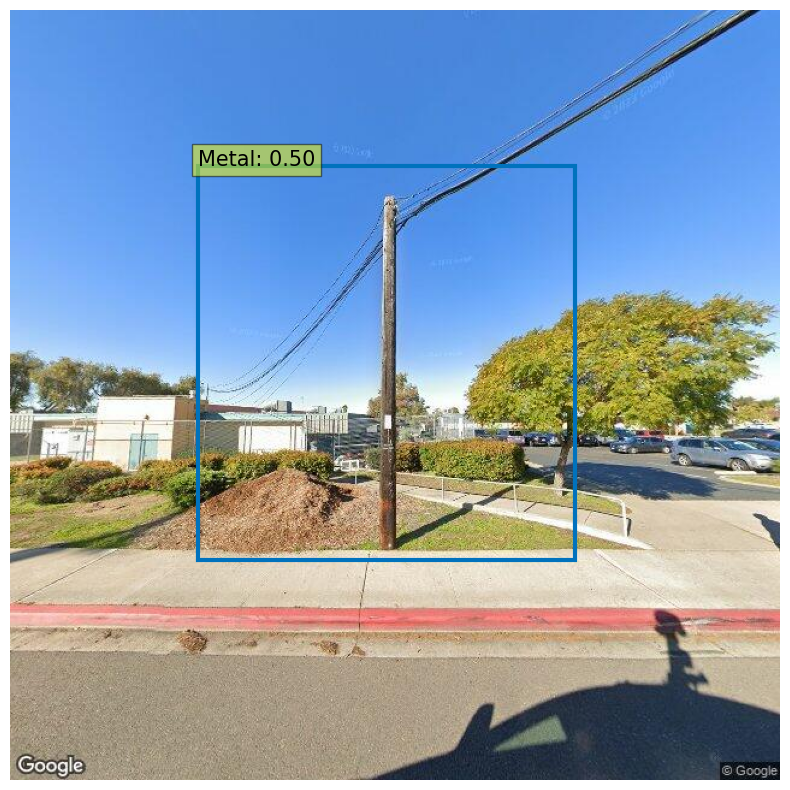

In [33]:
threshold = 0.4
for i in glob.glob('../temp/*.jpg'):
  im = cv2.imread(i)

  run_worflow(im,predictor,i)

In [ ]:
# Choose whether to start indexing categories with 0 or with 1.
#
# NB: convention in COCO dataset is such that the 1st class (person) has ID n°1.
#
# NB²: this is why we chose to set to 1 the default value of `first_class_index`
# in `via2coco.convert()`.

first_class_index = 0

In [ ]:
%cd /content/

!rm -rf VIA2COCO
!git clone https://github.com/woctezuma/VIA2COCO

%cd VIA2COCO/

!git checkout fixes

/content
Cloning into 'VIA2COCO'...
remote: Enumerating objects: 63, done.
remote: Counting objects: 100% (43/43), done.
remote: Compressing objects: 100% (23/23), done.
remote: Total 63 (delta 25), reused 36 (delta 20), pack-reused 20
Receiving objects: 100% (63/63), 16.41 KiB | 2.05 MiB/s, done.
Resolving deltas: 100% (32/32), done.
/content/VIA2COCO
Already on 'fixes'
Your branch is up to date with 'origin/fixes'.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


We expect the directory structure to be the following:
```
path/to/coco/
├ annotations/  # JSON annotations
│  ├ annotations/custom_train.json
│  └ annotations/custom_val.json
├ train2017/    # training images
└ val2017/      # validation images
```

In [23]:
!mkdir -p /content/data
!git clone https://github.com/sunwoo604/detrdata.git /content/data

Cloning into '/content/data'...
remote: Enumerating objects: 2751, done.
remote: Total 2751 (delta 0), reused 0 (delta 0), pack-reused 2751
Receiving objects: 100% (2751/2751), 168.08 MiB | 21.71 MiB/s, done.
Resolving deltas: 100% (19/19), done.


- Documentation: https://detectron2.readthedocs.io/tutorials/datasets.html

In [24]:
from detectron2.data.datasets import register_coco_instances

register_coco_instances("pole_train",
                        {},
                        "/content/data/custom/annotations/custom_train.json",
                        "/content/data/custom/train2017/")

register_coco_instances("pole_val",
                        {},
                        "/content/data/custom/annotations/custom_val.json",
                        "/content/data/custom/val2017/")

In [25]:
cat_names = ["Wooden","Metal"]

for keyword in ['train', 'val']:
  MetadataCatalog.get('pole_{}'.format(keyword)).set(thing_classes=cat_names)

custom_metadata = MetadataCatalog.get("pole_train")
custom_metadata

namespace(name='pole_train',
          json_file='/content/data/custom/annotations/custom_train.json',
          image_root='/content/data/custom/train2017/',
          evaluator_type='coco',
          thing_classes=['Wooden', 'Metal'])

## Check the dataset after it was pre-processed for fine-tuning

To verify the data loading is correct, let's visualize the annotations of randomly selected samples in the training set:
-   Demo of COCO API: https://github.com/cocodataset/cocoapi/blob/master/PythonAPI/pycocoDemo.ipynb

[03/07 09:26:50 d2.data.datasets.coco]: Loaded 1122 images in COCO format from /content/data/custom/annotations/custom_train.json
/content/data/custom/train2017/Sunny_metal_0002_0_40.jpg


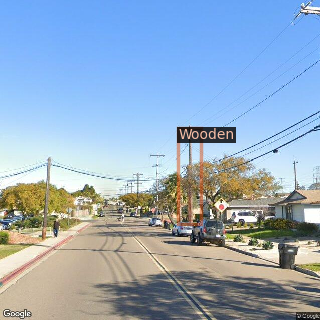

/content/data/custom/train2017/Sunny_wooden_0018_3_40.jpg


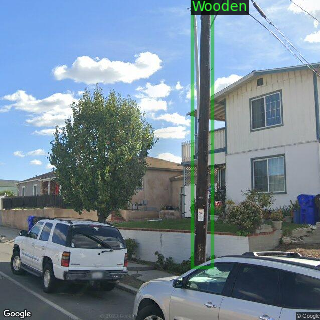

/content/data/custom/train2017/derek_metal_lat32.9587855_lon-117.2665225_angle325_zoom150.jpg


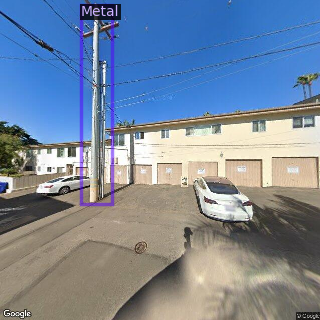

In [ ]:
dataset_dicts = DatasetCatalog.get("pole_train")
for d in random.sample(dataset_dicts, 3):
    print(d["file_name"])
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=custom_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

## Fine-tuning

-   The wrapper is here: https://github.com/facebookresearch/detr/tree/master/d2
-   A demo is showcased in [a Colab notebook](https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5).

Caveat: **this wrapper currently supports only box detection**.

In [ ]:
%cd /content/detr/

/content/detr


In [ ]:
from d2.detr import add_detr_config

cfg = get_cfg()

add_detr_config(cfg)
cfg.merge_from_file("d2/configs/detr_256_6_6_torchvision.yaml")

cfg.DATASETS.TRAIN = ("pole_train",)
cfg.DATASETS.TEST = ("pole_val",)

cfg.OUTPUT_DIR = '/content/outputs/'

cfg.MODEL.WEIGHTS = "/content/detr/converted_model.pth"
cfg.MODEL.DETR.NUM_CLASSES = 2

In [ ]:
cfg.DATALOADER.NUM_WORKERS = 2
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00005  # pick a good LR
cfg.SOLVER.MAX_ITER = 1750
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  # wooden and metal

In [ ]:
# from detectron2.engine import DefaultTrainer
from d2.train_net import Trainer

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
# trainer = DefaultTrainer(cfg)
trainer = Trainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[03/07 09:31:13 d2.engine.defaults]: Model:
Detr(
  (detr): DETR(
    (transformer): Transformer(
      (encoder): TransformerEncoder(
        (layers): ModuleList(
          (0-5): 6 x TransformerEncoderLayer(
            (self_attn): MultiheadAttention(
              (out_proj): NonDynamicallyQuantizableLinear(in_features=256, out_features=256, bias=True)
            )
            (linear1): Linear(in_features=256, out_features=2048, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
            (linear2): Linear(in_features=2048, out_features=256, bias=True)
            (norm1): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
            (norm2): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
            (dropout1): Dropout(p=0.1, inplace=False)
            (dropout2): Dropout(p=0.1, inplace=False)
          )
        )
      )
      (decoder): TransformerDecoder(
        (layers): ModuleList(
          (0-5): 6 x TransformerDecoderLayer(
            (self_

criterion.empty_weight
detr.class_embed.{bias, weight}


[03/07 09:31:13 d2.engine.train_loop]: Starting training from iteration 0
[03/07 09:31:25 d2.utils.events]:  eta: 0:15:24  iter: 19  total_loss: 212.4  loss_ce: 0.7259  loss_bbox: 2.955  loss_giou: 1.87  loss_ce_0: 0.906  loss_bbox_0: 2.934  loss_giou_0: 1.891  loss_ce_1: 0.7829  loss_bbox_1: 3.009  loss_giou_1: 1.961  loss_ce_2: 0.8154  loss_bbox_2: 3.145  loss_giou_2: 1.872  loss_ce_3: 0.8115  loss_bbox_3: 3.192  loss_giou_3: 1.875  loss_ce_4: 0.7458  loss_bbox_4: 2.983  loss_giou_4: 1.873    time: 0.5704  last_time: 0.5205  data_time: 0.0394  last_data_time: 0.0056   lr: 5e-05  max_mem: 3279M
[03/07 09:31:37 d2.utils.events]:  eta: 0:15:18  iter: 39  total_loss: 136.5  loss_ce: 0.5426  loss_bbox: 1.104  loss_giou: 1.125  loss_ce_0: 0.783  loss_bbox_0: 1.17  loss_giou_0: 1.221  loss_ce_1: 0.6395  loss_bbox_1: 1.241  loss_giou_1: 1.142  loss_ce_2: 0.6445  loss_bbox_2: 1.117  loss_giou_2: 1.138  loss_ce_3: 0.601  loss_bbox_3: 1.078  loss_giou_3: 1.161  loss_ce_4: 0.5706  loss_bbox_4: 1

## Check the results

In [ ]:
%cd /content/detr/

/content/detr


### TensorBoard

As mentioned in the left panel, there is a smoothing factor (0.6 by default):
-   solid lines are raw results,
-   semi-transparent lines are smoothed results.

NB: validation results do **not** seem to be available, only training results are.

In [ ]:
# Look at training curves in tensorboard:
%reload_ext tensorboard
%tensorboard --logdir /content/outputs/

Reusing TensorBoard on port 6006 (pid 3250), started 2:18:54 ago. (Use '!kill 3250' to kill it.)

<IPython.core.display.Javascript object>

[03/07 09:50:10 d2.data.datasets.coco]: Loaded 553 images in COCO format from /content/data/custom/annotations/custom_val.json
['pred_boxes', 'scores', 'pred_classes']
Wooden: 0.5387258529663086


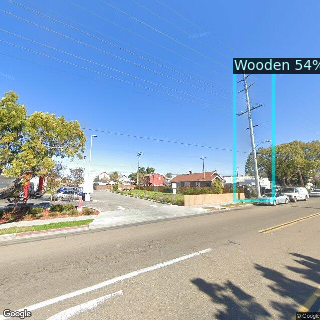

['pred_boxes', 'scores', 'pred_classes']
Metal: 0.4735119938850403


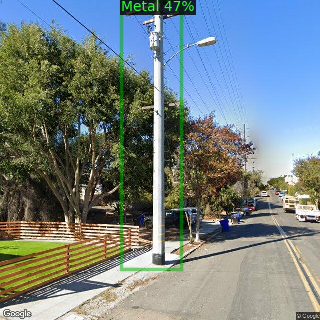

['pred_boxes', 'scores', 'pred_classes']
Wooden: 0.5560086369514465


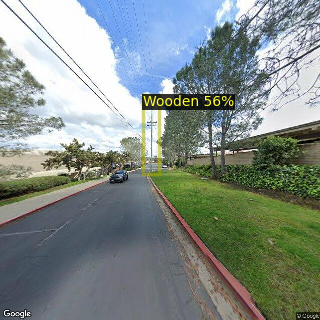

['pred_boxes', 'scores', 'pred_classes']
Metal: 0.5762295126914978
Metal: 0.47359925508499146
Wooden: 0.48212769627571106


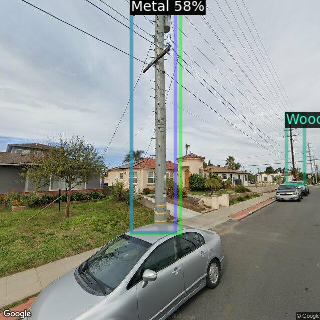

['pred_boxes', 'scores', 'pred_classes']
Wooden: 0.5658634901046753
Wooden: 0.451595664024353
Wooden: 0.5077745914459229
Wooden: 0.5670823454856873
Metal: 0.513420045375824
Metal: 0.571142852306366


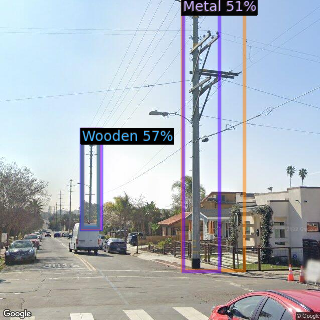

['pred_boxes', 'scores', 'pred_classes']
Metal: 0.48599785566329956


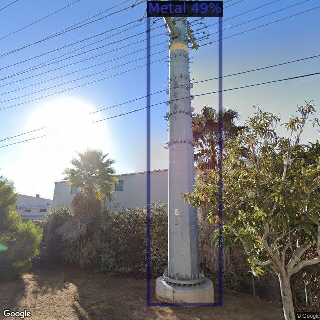

['pred_boxes', 'scores', 'pred_classes']
Wooden: 0.4683481454849243
Wooden: 0.6683395504951477


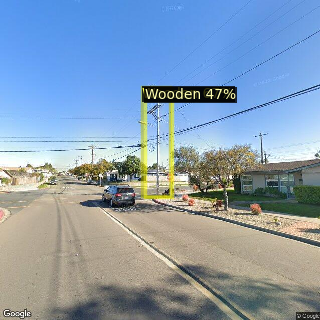

['pred_boxes', 'scores', 'pred_classes']
Wooden: 0.4858884811401367
Wooden: 0.5537024140357971


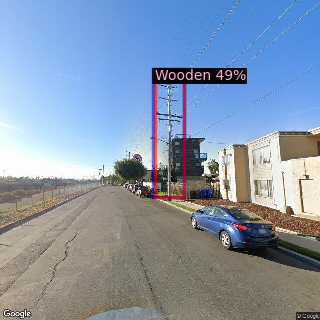

['pred_boxes', 'scores', 'pred_classes']
Metal: 0.5310640931129456
Metal: 0.581866443157196


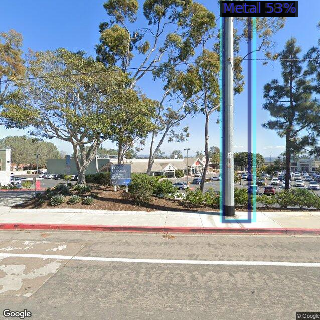

['pred_boxes', 'scores', 'pred_classes']
Metal: 0.5408839583396912
Metal: 0.5309314727783203


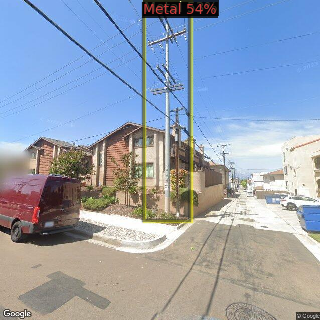

In [ ]:
threshold = 0.43
cl = ['Wooden','Metal']
dataset_dicts = DatasetCatalog.get("pole_val")
for d in random.sample(dataset_dicts, 10):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)

    filtered_predictions = filter_predictions_from_outputs(outputs,
                                                           threshold=threshold)
    for c,s in zip(filtered_predictions.pred_classes,filtered_predictions.scores):
      print("{}: {}".format(cl[c],s))
    v = Visualizer(im[:, :, ::-1],
                   metadata=custom_metadata,
                   scale=0.5,
    )
    out = v.draw_instance_predictions(filtered_predictions)
    cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
filtered_predictions

Instances(num_instances=1, image_height=640, image_width=640, fields=[pred_boxes: Boxes(tensor([[3.8760e+02, 1.9775e-01, 4.5057e+02, 6.4000e+02]])), scores: tensor([0.4746]), pred_classes: tensor([1])])

We can also evaluate its performance using AP metric implemented in COCO API.

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("pole_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "pole_val")
print(inference_on_dataset(trainer.model, val_loader, evaluator))
# another equivalent way is to use trainer.test

[03/07 08:42:21 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [03/07 08:42:21 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[03/07 08:42:21 d2.data.datasets.coco]: Loaded 553 images in COCO format from /content/data/custom/annotations/custom_val.json
[03/07 08:42:21 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[03/07 08:42:21 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[03/07 08:42:21 d2.data.common]: Serializing 553 elements to byte tensors and concatenating them all ...
[03/07 08:42:21 d2.data.common]: Serialized dataset takes 0.15 MiB
[03/07 08:42:21 d2.evaluation.evaluator]: Start inference on 553 batches


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[03/07 08:42:23 d2.evaluation.evaluator]: Inference done 11/553. Dataloading: 0.0029 s/iter. Inference: 0.1474 s/iter. Eval: 0.0006 s/iter. Total: 0.1509 s/iter. ETA=0:01:21
[03/07 08:42:28 d2.evaluation.evaluator]: Inference done 36/553. Dataloading: 0.0065 s/iter. Inference: 0.1871 s/iter. Eval: 0.0006 s/iter. Total: 0.1944 s/iter. ETA=0:01:40
[03/07 08:42:33 d2.evaluation.evaluator]: Inference done 69/553. Dataloading: 0.0043 s/iter. Inference: 0.1681 s/iter. Eval: 0.0006 s/iter. Total: 0.1732 s/iter. ETA=0:01:23
[03/07 08:42:39 d2.evaluation.evaluator]: Inference done 98/553. Dataloading: 0.0039 s/iter. Inference: 0.1695 s/iter. Eval: 0.0006 s/iter. Total: 0.1741 s/iter. ETA=0:01:19
[03/07 08:42:44 d2.evaluation.evaluator]: Inference done 127/553. Dataloading: 0.0040 s/iter. Inference: 0.1690 s/iter. Eval: 0.0006 s/iter. Total: 0.1738 s/iter. ETA=0:01:14
[03/07 08:42:49 d2.evaluation.evaluator]: Inference done 161/553. Dataloading: 0.0036 s/iter. Inference: 0.1644 s/iter. Eval: 0.0

### With a validation image